The purpose of this notebook is to check to make sure our data processing pipeline works.

In [61]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
%config InlineBackend.figure_format = 'retina'


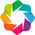

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import loren_frank_data_processing as lfdp
import spectral_connectivity
import ripple_detection
import replay_classification

import logging
logging.basicConfig(level=logging.INFO)

## Task Data

Make sure we can get information about the experimental setup

In [3]:
from src.parameters import ANIMALS

epoch_info = lfdp.make_epochs_dataframe(ANIMALS)
epoch_info

environment   type  exposure
animal day epoch                                    
JZ1    1   1                  sleep  sleep       NaN
           2                 wtrack    run       1.0
           3                  sleep  sleep       NaN
           4                 wtrack    run       2.0
           5                  sleep  sleep       NaN
           6              openfield    run       1.0
           7                  sleep  sleep       NaN
           8              openfield    run       2.0
           9                  sleep  sleep       NaN
       2   1                  sleep  sleep       NaN
           2                 wtrack    run       3.0
           3                  sleep  sleep       NaN
           4                 wtrack    run       4.0
           5                  sleep  sleep       NaN
           6              openfield    run       3.0
           7                  sleep  sleep       NaN
           8              openfield    run       4.0
           9                  sleep  sleep       NaN
       3   1                  sleep  sleep       NaN
           2                 wtrack    run       5.0
           3                  sleep  sleep       NaN
           4                 wtrack    run       6.0
           5                  sleep  sleep       NaN
           6              openfield    run       5.0
           7                  sleep  sleep       NaN
           8              openfield    run       6.0
           9                  sleep  sleep       NaN
       4   1                  sleep  sleep       NaN
           2                 wtrack    run       7.0
           3                  sleep  sleep       NaN
...                             ...    ...       ...
       11  7                  sleep  sleep       NaN
           8              openfield    run      22.0
           9                  sleep  sleep       NaN
       12  1                  sleep  sleep       NaN
           2      sixarmtrack_right    run       5.0
           3                  sleep  sleep       NaN
           4      sixarmtrack_right    run       6.0
           5                  sleep  sleep       NaN
           6              openfield    run      23.0
           7                  sleep  sleep       NaN
           8              openfield    run      24.0
           9                  sleep  sleep       NaN
       13  1                  sleep  sleep       NaN
           2      sixarmtrack_right    run       7.0
           3                  sleep  sleep       NaN
           4      sixarmtrack_right    run       8.0
           5                  sleep  sleep       NaN
           6              openfield    run      25.0
           7                  sleep  sleep       NaN
           8              openfield    run      26.0
           9                  sleep  sleep       NaN
       14  1                  sleep  sleep       NaN
           2      sixarmtrack_right    run       9.0
           3                  sleep  sleep       NaN
           4      sixarmtrack_right    run      10.0
           5                  sleep  sleep       NaN
           6              openfield    run      27.0
           7                  sleep  sleep       NaN
           8              openfield    run      28.0
           9                  sleep  sleep       NaN

[126 rows x 3 columns]

In [4]:
epoch_key = ('JZ1', 1, 2)

## Position Data
Make sure we can get the 2D and linear position

In [5]:
position_info = lfdp.get_interpolated_position_dataframe(
    epoch_key, ANIMALS, max_distance_from_well=5)
position_info.head()

,labeled_segments,from_well,to_well,task,is_correct,x_position,y_position,head_direction,speed,linear_distance
time,,,,,,,,,,
00:28:00.085200,1.0,NaN,NaN,NaN,NaN,47.222953,51.47623,-3.077724,5.142901,42.241868
00:28:00.085867,1.0,NaN,NaN,NaN,NaN,47.222953,51.47623,-3.077724,5.142901,42.241868
00:28:00.086533,1.0,NaN,NaN,NaN,NaN,47.222953,51.47623,-3.077724,5.142901,42.241868
00:28:00.087200,1.0,NaN,NaN,NaN,NaN,47.222953,51.47623,-3.077724,5.142901,42.241868
00:28:00.087867,1.0,NaN,NaN,NaN,NaN,47.222953,51.47623,-3.077724,5.142901,42.241868


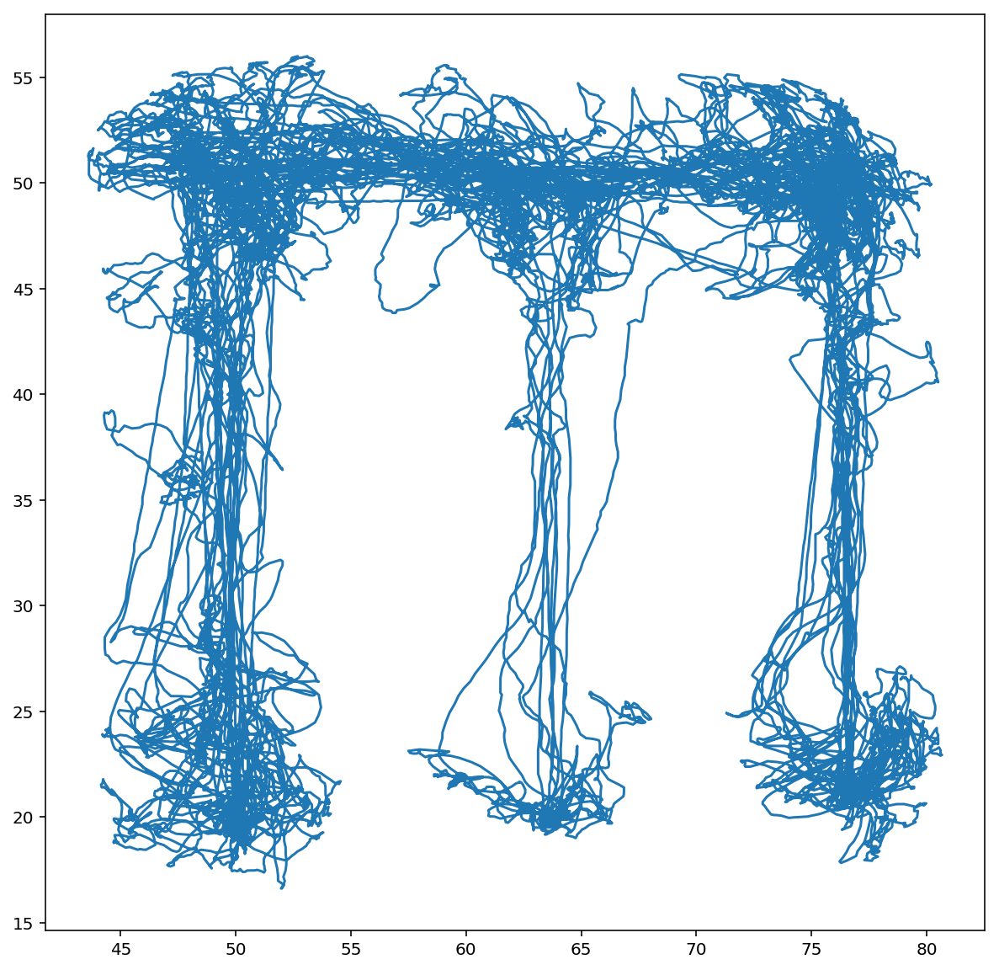

In [6]:
plt.figure(figsize=(10, 10))
plt.plot(position_info.x_position.values, position_info.y_position.values);

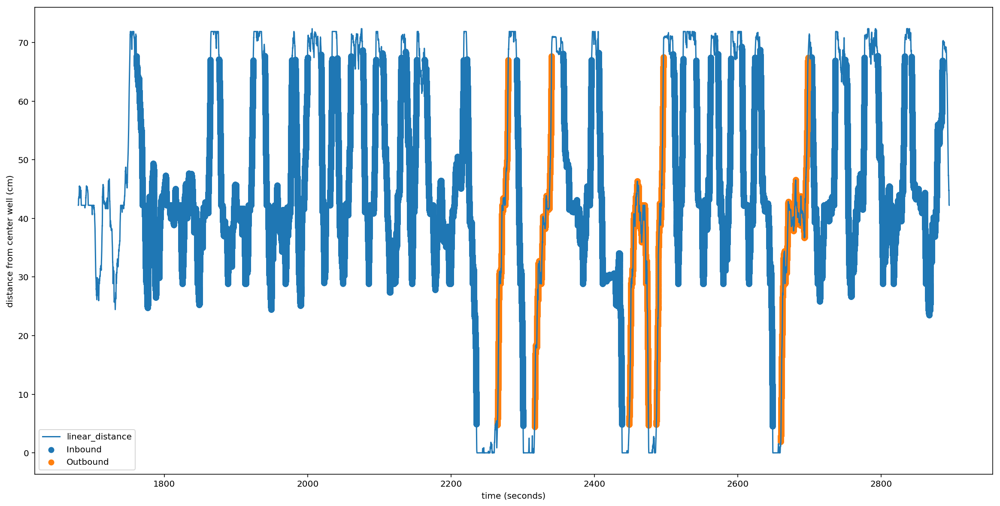

In [7]:
plt.figure(figsize=(20, 10))

plt.plot(position_info.index.total_seconds(), position_info.linear_distance)

for label, df in position_info.groupby('task'):
    plt.scatter(df.index.total_seconds(), df.linear_distance, label=label)

plt.xlabel('time (seconds)')
plt.ylabel('distance from center well (cm)')
plt.legend();

3


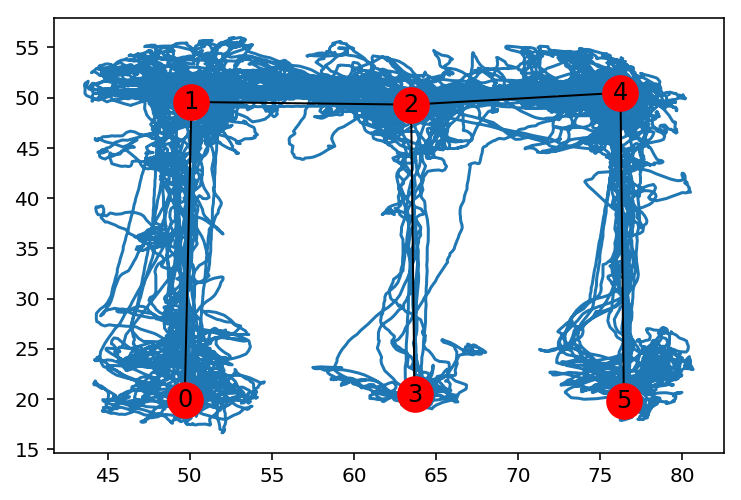

In [8]:
track_graph, center_well_id = lfdp.position.make_track_graph(epoch_key, ANIMALS)
plt.plot(position_info.x_position.values, position_info.y_position.values, zorder=-1);
lfdp.track_segment_classification.plot_track(track_graph, ax=None)

print(center_well_id)

In [9]:
position_df = lfdp.position.get_position_dataframe(epoch_key, ANIMALS)
position = position_df.loc[:, ['x_position', 'y_position']].values
track_segment_id = lfdp.track_segment_classification.classify_track_segments(
    track_graph, position,
    route_euclidean_distance_scaling=1E-1)


In [10]:
linear_distance = lfdp.track_segment_classification.calculate_linear_distance(
    track_graph, track_segment_id, center_well_id, position)

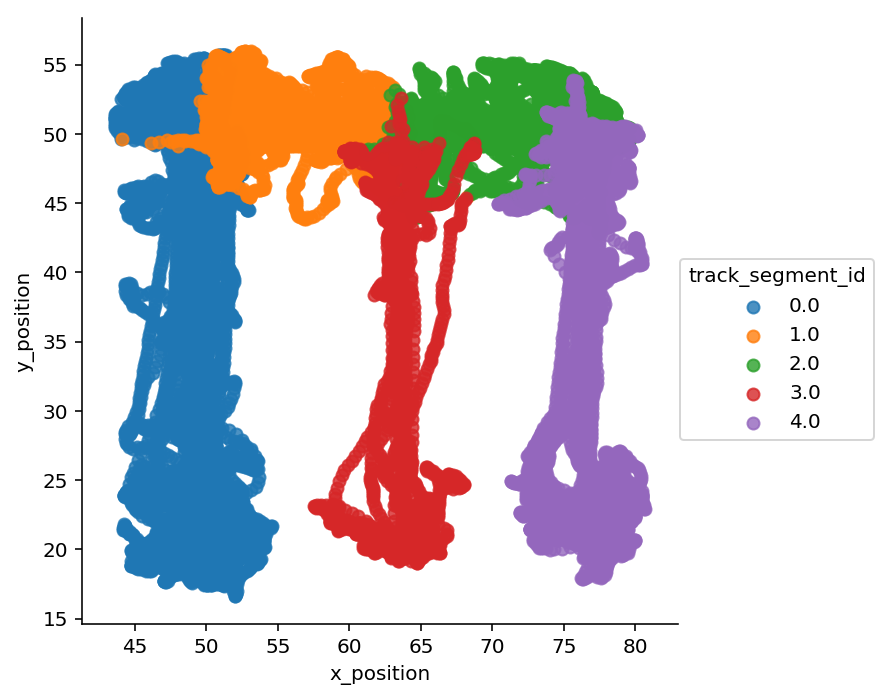

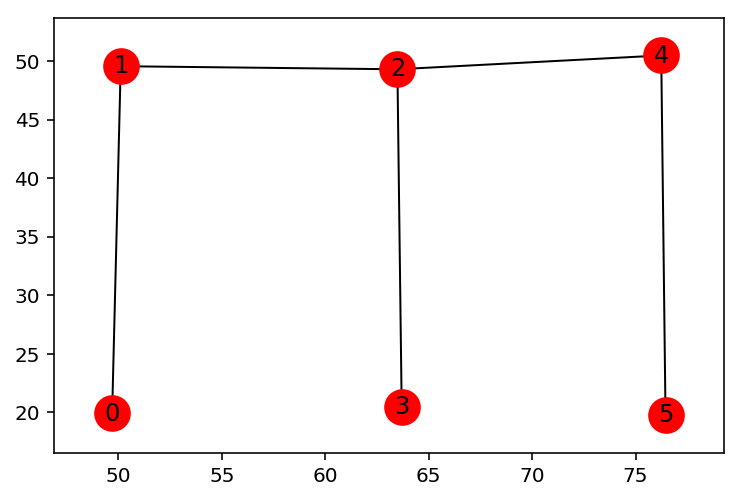

In [11]:
position_df['track_segment_id'] = track_segment_id
sns.lmplot('x_position', 'y_position', data=position_df , hue='track_segment_id', fit_reg=False)

plt.figure()
lfdp.track_segment_classification.plot_track(track_graph, ax=None)

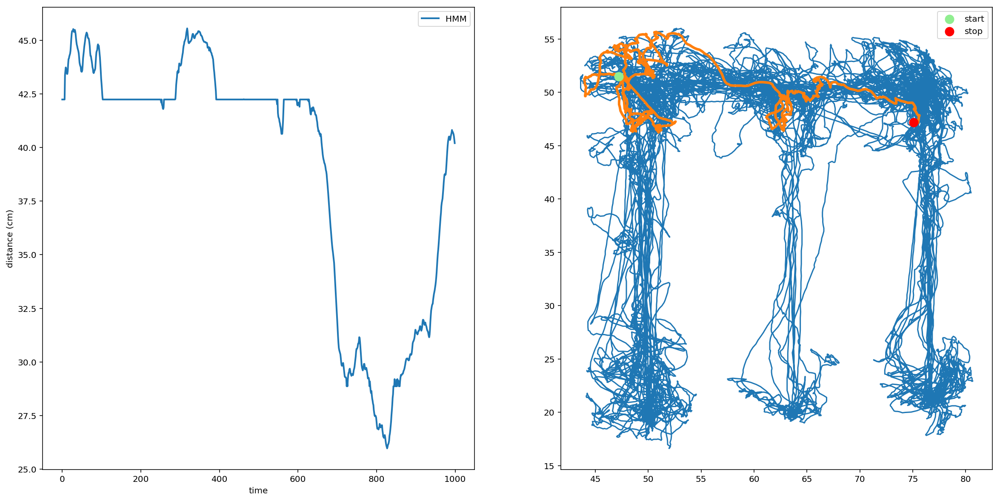

In [12]:
def plot_linear_distance(linear_distance, position, indices):
    time_ind = slice(*indices)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].plot(linear_distance[time_ind], linewidth=2, label='HMM')
    axes[0].set_xlabel('time')
    axes[0].set_ylabel('distance (cm)')
    axes[0].legend();
    
    axes[1].plot(position[:, 0], position[:, 1])
    axes[1].plot(position[time_ind][:, 0], position[time_ind][:, 1],
                 linewidth=3)
    start_stop = position[time_ind][[0, -1], :]
    axes[1].scatter(start_stop[0, 0], start_stop[0, 1],
                    label='start', color='lightgreen', s=100, zorder=1000)
    axes[1].scatter(start_stop[1, 0], start_stop[1, 1],
                    label='stop', color='red', s=100, zorder=1000)
    axes[1].legend()
    
    
plot_linear_distance(linear_distance, position, (0, 1000))

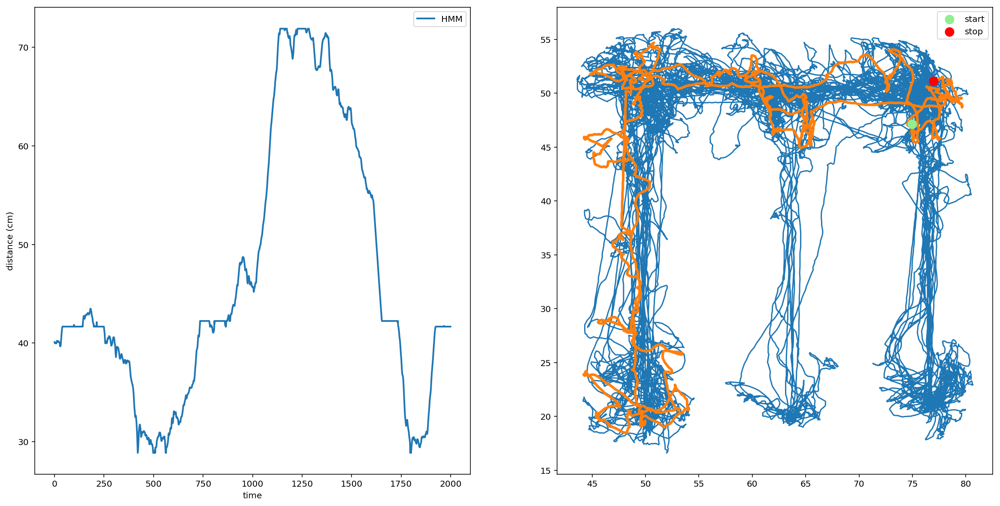

In [13]:
plot_linear_distance(linear_distance, position, (1000, 3000))

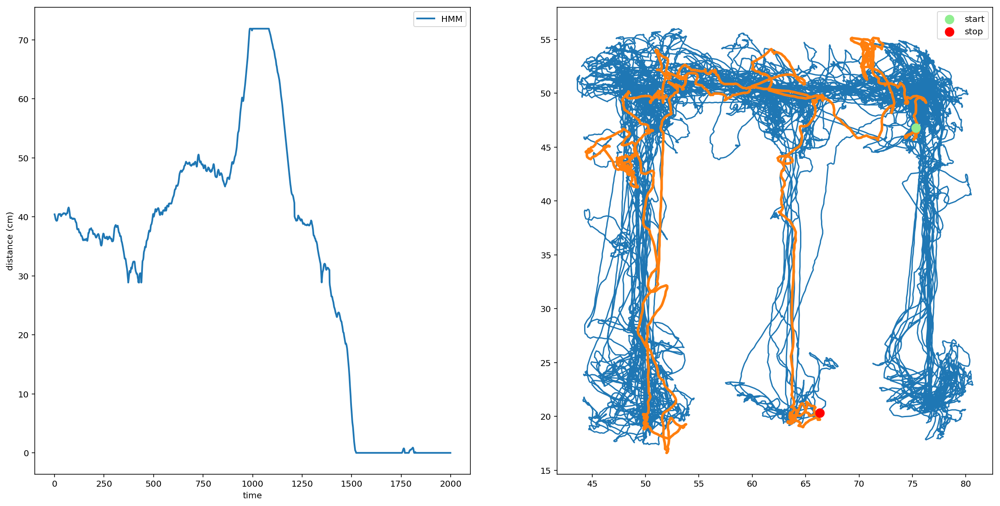

In [14]:
plot_linear_distance(linear_distance, position, (15000, 17000))

## Tetrode Data

Make sure we can get information about the tetrode locations

In [7]:
tetrode_info = lfdp.make_tetrode_dataframe(ANIMALS).xs(epoch_key, drop_level=False)
tetrode_info

area  depth  nchans  numcells   ref subarea  \
animal day epoch tetrode_number                                               
JZ1    1   2     1               mec      0       4         0  11.0       2   
                 2               mec      0       4         0  11.0       5   
                 3               mec      0       8         0  11.0       5   
                 4               mec      0       4         0  11.0       6   
                 5               sub      0       4         0  11.0       d   
                 6               mec      0       4         0  11.0       6   
                 7               mec      0       4         0  11.0       5   
                 8               mec      0       4         0  11.0       2   
                 9               mec      0       4         0  11.0       2   
                 10              mec      0       8         0  11.0       3   
                 11              ref      0       4         0   NaN           
                 12              v2l      0       4         0  11.0       6   
                 13              por      0       4         0  11.0       6   
                 14              mec      0       4         0  11.0       6   
                 15              por      0       4         0  11.0       6   
                 16              ca1      0       4         0  11.0       d   
                 17              ca1      0       4         0  11.0       d   
                 18              ca1      0       4         0  11.0       d   
                 19              ca1      0       4         0  11.0       d   
                 20              ca1      0       4         0  11.0       d   
                 21              ca1      0       4         0  11.0       d   
                 22              ca1      0       4         0  11.0       d   
                 23              ca1      0       4         0  11.0       d   
                 24              ca1      0       4         0  11.0       d   
                 25              ca1      0       4         0  11.0       d   
                 26              ca1      0       4         0  11.0       d   
                 27              ca1      0       4         0  11.0       d   
                 28              ca1      0       4         0  11.0       d   
                 29              ca1      0       4         0  11.0       d   
                 30              ca1      0       4         0  11.0       d   

                                suparea     tetrode_id  
animal day epoch tetrode_number                         
JZ1    1   2     1                  ctx  JZ1_01_02_001  
                 2                  ctx  JZ1_01_02_002  
                 3                  ctx  JZ1_01_02_003  
                 4                  ctx  JZ1_01_02_004  
                 5                  hpc  JZ1_01_02_005  
                 6                  ctx  JZ1_01_02_006  
                 7                  ctx  JZ1_01_02_007  
                 8                  ctx  JZ1_01_02_008  
                 9                  ctx  JZ1_01_02_009  
                 10                 ctx  JZ1_01_02_010  
                 11                      JZ1_01_02_011  
                 12                 ctx  JZ1_01_02_012  
                 13                 ctx  JZ1_01_02_013  
                 14                 ctx  JZ1_01_02_014  
                 15                 ctx  JZ1_01_02_015  
                 16                 hpc  JZ1_01_02_016  
                 17                 hpc  JZ1_01_02_017  
                 18                 hpc  JZ1_01_02_018  
                 19                 hpc  JZ1_01_02_019  
                 20                 hpc  JZ1_01_02_020  
                 21                 hpc  JZ1_01_02_021  
                 22                 hpc  JZ1_01_02_022  
                 23                 hpc  JZ1_01_02_023  
                 24                 hpc  JZ1_01_02_024  
                 25  

## Detect Ripples

Make sure we can detect ripples

In [8]:
is_brain_areas = tetrode_info.area.isin(['ca1'])
tetrode_keys = tetrode_info[is_brain_areas].index.tolist()
tetrode_info[is_brain_areas].loc[:, ['area']]

area
animal day epoch tetrode_number     
JZ1    1   2     16              ca1
                 17              ca1
                 18              ca1
                 19              ca1
                 20              ca1
                 21              ca1
                 22              ca1
                 23              ca1
                 24              ca1
                 25              ca1
                 26              ca1
                 27              ca1
                 28              ca1
                 29              ca1
                 30              ca1

In [9]:
hippocampus_lfps = lfdp.get_LFPs(tetrode_keys, ANIMALS)
time = hippocampus_lfps.index

speed = lfdp.get_interpolated_position_dataframe(
    epoch_key, ANIMALS).speed

sampling_frequency = 1500

ripple_times = ripple_detection.Kay_ripple_detector(
        time, hippocampus_lfps.values, speed.values, sampling_frequency,
        minimum_duration=pd.Timedelta(milliseconds=15), zscore_threshold=3)

In [10]:
ripple_times.head()

,start_time,end_time
ripple_number,,
1,00:28:03.733867,00:28:03.821867
2,00:28:04.379200,00:28:04.437867
3,00:28:07.081867,00:28:07.135200
4,00:28:08.576533,00:28:08.680533
5,00:28:09.424533,00:28:09.501200


##  Ripple Power

Make sure we get ripple band power for detected ripples.

In [19]:
window_offset = (-0.5, 0.5)

ripple_locked_LFPs = lfdp.reshape_to_segments(
    hippocampus_lfps, ripple_times,
    window_offset=window_offset, sampling_frequency=sampling_frequency)
ripple_locked_LFPs.columns = tetrode_info[is_brain_areas].tetrode_id
ripple_locked_LFPs = (ripple_locked_LFPs.to_xarray()
                      .to_array(dim='signals').transpose('time', 'ripple_number', 'signals'))
m = spectral_connectivity.Multitaper(
    ripple_locked_LFPs.values, sampling_frequency, time_window_duration=0.100,
    time_halfbandwidth_product=3, start_time=window_offset[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
ripple_locked_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + 0.050, frequency=c.frequencies), name='power')

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=0.1, time_window_step=0.1,
           detrend_type='constant', start_time=-0.5, n_tapers=5)


In [20]:
m = spectral_connectivity.Multitaper(
    hippocampus_lfps.values, sampling_frequency, time_window_duration=0.100,
    time_halfbandwidth_product=3, start_time=hippocampus_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + 0.050, frequency=c.frequencies), name='power')


INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=0.1, time_window_step=0.1,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=5)


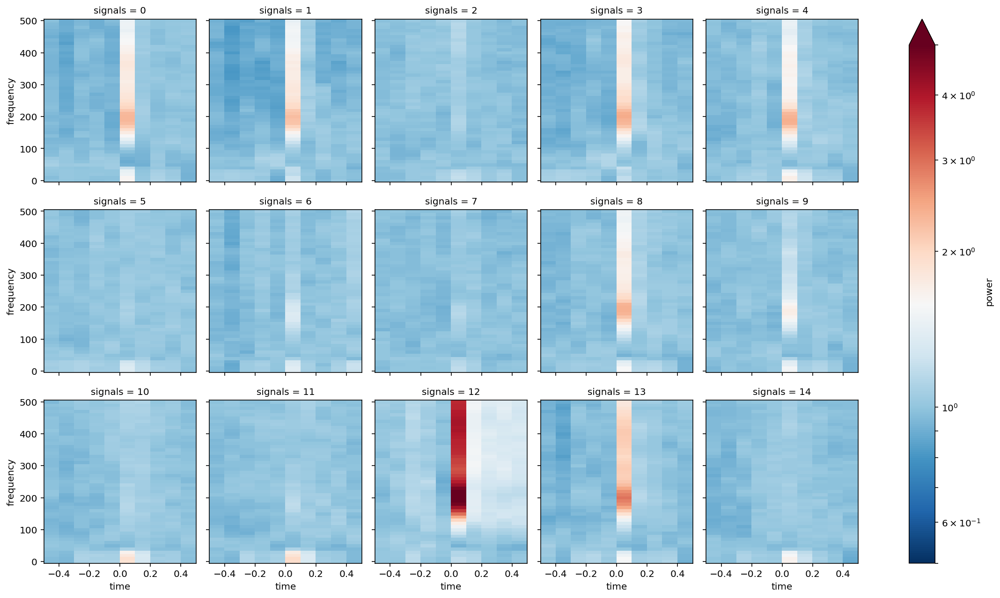

In [21]:
from matplotlib.colors import LogNorm

vmin, vmax = 0.5, 5

(ripple_locked_power / power.mean('time')).sel(frequency=slice(0, 500)).plot(
    x='time', y='frequency', col='signals', col_wrap=5, center=0,
    norm=LogNorm(vmin=vmin, vmax=vmax), vmin=vmin, vmax=vmax,
    cmap='RdBu_r');

In [22]:
ripple_duration = ripple_times.end_time.dt.total_seconds() - ripple_times.start_time.dt.total_seconds()

In [23]:
ripple_filtered_LFPs = pd.DataFrame(
    np.stack([ripple_detection.filter_ripple_band(lfp, sampling_frequency)
              for lfp in hippocampus_lfps.values.T], axis=1),
    index=time, columns=tetrode_keys)

ripple_locked_filtered_LFPs = lfdp.reshape_to_segments(
    ripple_filtered_LFPs, ripple_times, window_offset=window_offset,
    sampling_frequency=sampling_frequency)

In [24]:
m = spectral_connectivity.Multitaper(hippocampus_lfps.values, sampling_frequency, time_window_duration=0.020,
                                     time_window_step=0.004,
               time_halfbandwidth_product=1, start_time=time.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
ripple_power = xr.DataArray(c.power(), dims=('time', 'frequency', 'signals'),
                            coords=dict(time=pd.TimedeltaIndex(c.time, unit='s'), frequency=c.frequencies), name='power')
ripple_power = ripple_power.sel(frequency=200).reindex(time)
ripple_power /= ripple_power.mean('time')
ripple_locked_power = lfdp.reshape_to_segments(
    ripple_power.drop('frequency').to_dataframe().unstack(), ripple_times, window_offset,
    sampling_frequency=sampling_frequency)

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=1,
           time_window_duration=0.02, time_window_step=0.004,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=1)


In [25]:
from ipywidgets import interact

ripple_time = ripple_locked_LFPs.get_index('time').total_seconds().values

def plot_lfp(ripple_number=1):
    n_LFPs = hippocampus_lfps.shape[1]
    fig, axes = plt.subplots(n_LFPs, 3, figsize=(20, 10), sharex=True)
    for ax, lfp in zip(
            axes[:, 0], ripple_locked_LFPs.sel(ripple_number=1).values.T):
        ax.plot(ripple_time, lfp)
        ax.axvspan(0, ripple_duration.loc[ripple_number], alpha=0.2)
        ax.axhline(0, color='black', linestyle='--')

    for ax, lfp in zip(
            axes[:, 1], ripple_locked_filtered_LFPs.loc[ripple_number].values.T):
        ax.plot(ripple_time, lfp, color='orange')
        ax.axvspan(0, ripple_duration.loc[ripple_number], alpha=0.2)
        ax.axhline(0, color='black', linestyle='--')

    power_time = ripple_locked_power.loc[ripple_number].index.total_seconds().values
    for ax, p in zip(axes[:, 2], ripple_locked_power.loc[ripple_number].values.T):
        ax.plot(power_time, p, color='purple')
        ax.axvspan(0, ripple_duration.loc[ripple_number], alpha=0.2)
        ax.axhline(1, color='black', linestyle='--')

    axes[0, 0].set_title('LFP')
    axes[0, 1].set_title('Bandpass Filtered LFP (150 - 250 Hz)')
    axes[0, 2].set_title('Ripple Power Change');

n_ripples = len(ripple_times)
interact(plot_lfp, ripple_number=(1, n_ripples), continuous_update=False);

interactive(children=(IntSlider(value=1, description='ripple_number', max=384, min=1), Output()), _dom_classes=('widget-interact',))

## Theta Power

Make sure there is hippocampal theta present

In [26]:
ca1_keys = tetrode_info.query('area == "ca1"').index
ca1_lfps = lfdp.get_LFPs(ca1_keys, ANIMALS)
m = spectral_connectivity.Multitaper(
    ca1_lfps.values, sampling_frequency, time_window_duration=3.000,
    time_halfbandwidth_product=3, start_time=ca1_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
theta_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + 0.500, frequency=c.frequencies, signals=ca1_keys), name='power')
m.frequency_resolution

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=3.0, time_window_step=3.0,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=5)


1.0

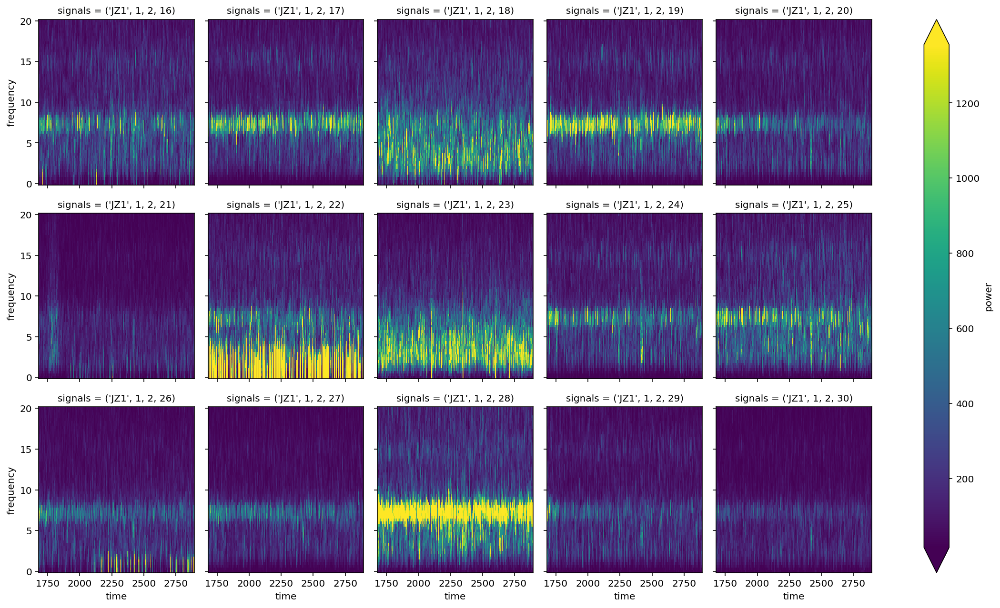

In [27]:
theta_power.sel(frequency=slice(0, 20)).plot(x='time', y='frequency', col='signals', col_wrap=5, robust=True);

Make sure MEC theta exists

In [28]:
mec_keys = tetrode_info.query('area == "mec"').index
mec_lfps = lfdp.get_LFPs(mec_keys, ANIMALS)
m = spectral_connectivity.Multitaper(
    mec_lfps.values, sampling_frequency, time_window_duration=3.000,
    time_halfbandwidth_product=3, start_time=mec_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
theta_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + 0.500, frequency=c.frequencies, signals=mec_keys), name='power')
m.frequency_resolution

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=3.0, time_window_step=3.0,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=5)


1.0

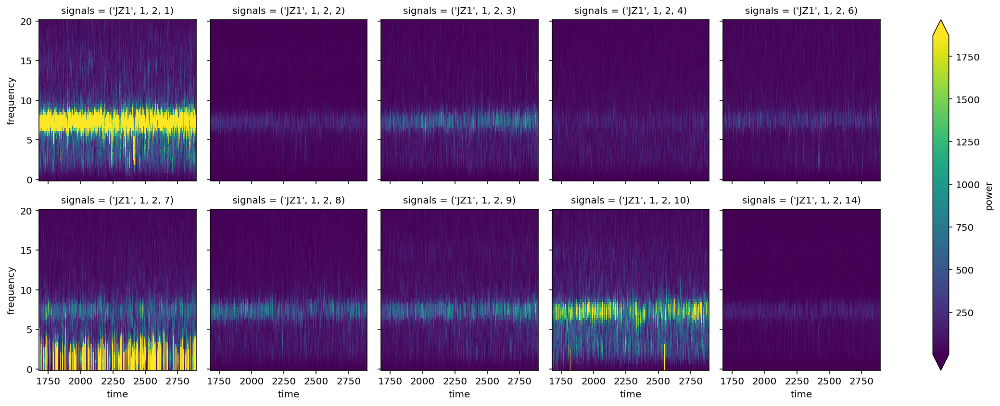

In [29]:
theta_power.sel(frequency=slice(0, 20)).plot(x='time', y='frequency', col='signals', col_wrap=5, robust=True);

## Gamma Power

In [56]:
ca1_keys = tetrode_info.query('area == "ca1"').index
ca1_lfps = lfdp.get_LFPs(ca1_keys, ANIMALS)
m = spectral_connectivity.Multitaper(
    ca1_lfps.values[speed > 4], sampling_frequency, time_window_duration=0.200,
    time_halfbandwidth_product=3, start_time=ca1_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
gamma_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + m.time_window_duration / 2, frequency=c.frequencies,
                signals=tetrode_info.query('area == "ca1"').tetrode_id), name='power')
m.frequency_resolution

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=3,
           time_window_duration=0.2, time_window_step=0.2,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=5)


15.0

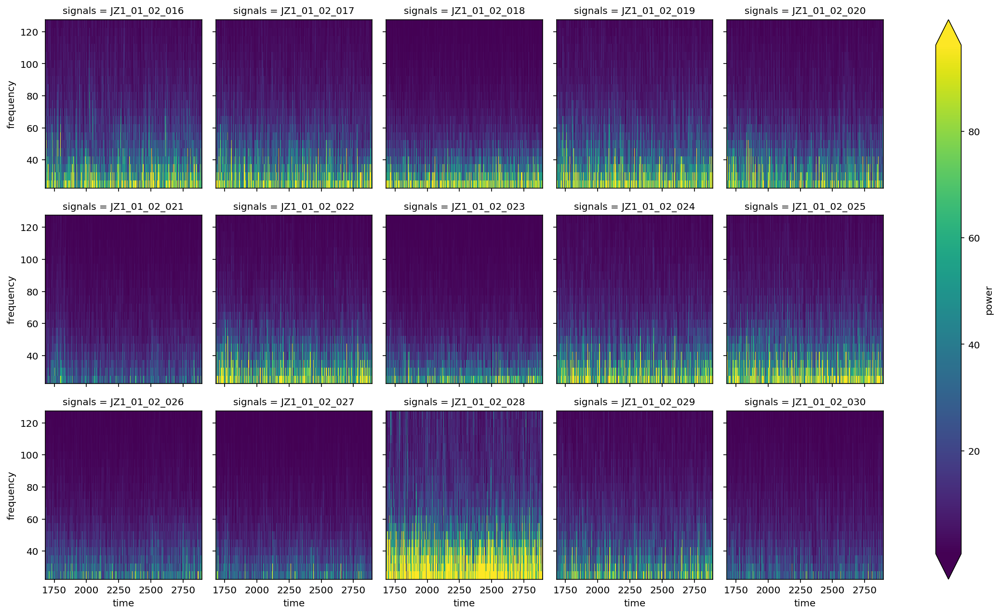

In [57]:
gamma_power.sel(frequency=slice(25, 125)).plot(x='time', y='frequency', col='signals', col_wrap=5, robust=True);

In [59]:
m = spectral_connectivity.Multitaper(
    ca1_lfps[speed > 4].values, sampling_frequency,
    time_halfbandwidth_product=9, start_time=ca1_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
gamma_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + m.time_window_duration / 2, frequency=c.frequencies,
                signals=tetrode_info.query('area == "ca1"').tetrode_id), name='power')


INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=9,
           time_window_duration=292.24, time_window_step=292.24,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=17)


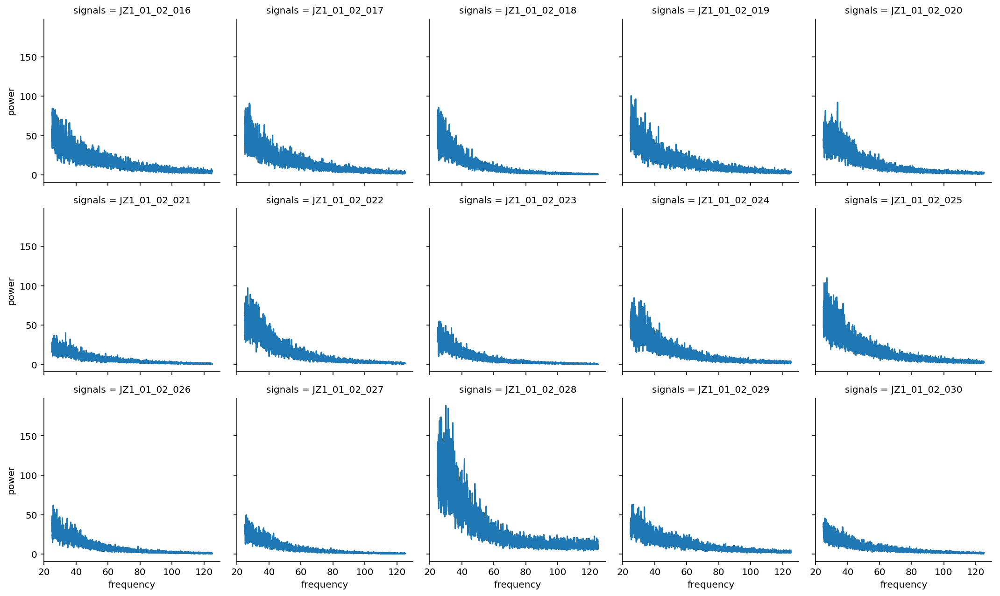

In [60]:
g = sns.FacetGrid(
    data=gamma_power.sel(frequency=slice(25, 125)).mean('time').to_dataframe().reset_index(),
    col='signals', col_wrap=5)
g.map(plt.plot, 'frequency', 'power')

Make sure MEC theta exists (~90 Hz)

In [ ]:
mec_keys = tetrode_info.query('area == "mec"').index
mec_lfps = lfdp.get_LFPs(mec_keys, ANIMALS)
m = spectral_connectivity.Multitaper(
    mec_lfps[speed > 4].values, sampling_frequency, time_window_duration=0.200,
    time_halfbandwidth_product=3, start_time=mec_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
gamma_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + m.time_window_duration / 2, frequency=c.frequencies,
                signals=tetrode_info.query('area == "mec"').tetrode_id), name='power')
m.frequency_resolution

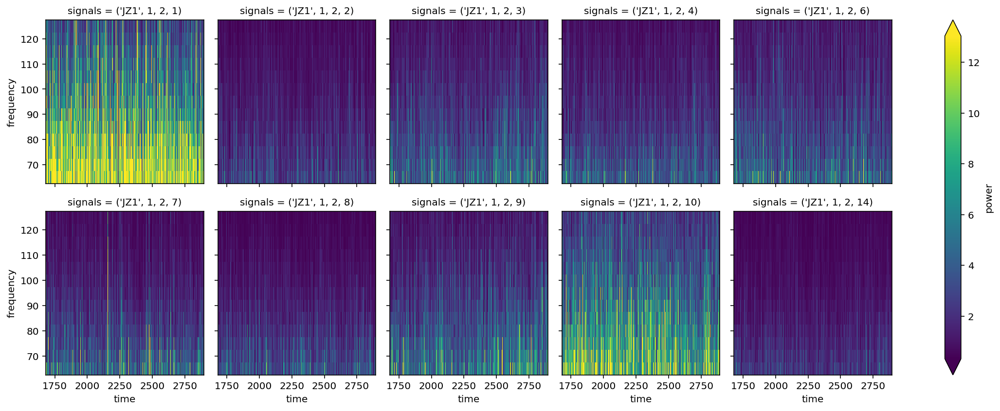

In [21]:
gamma_power.sel(frequency=slice(25, 125)).plot(x='time', y='frequency', col='signals', col_wrap=5, robust=True);

In [51]:
m = spectral_connectivity.Multitaper(
    mec_lfps[speed > 4].values, sampling_frequency,
    time_halfbandwidth_product=9, start_time=mec_lfps.index.total_seconds()[0])
c = spectral_connectivity.Connectivity.from_multitaper(m)
gamma_power = xr.DataArray(
    c.power(), dims=('time', 'frequency', 'signals'),
    coords=dict(time=c.time + m.time_window_duration / 2, frequency=c.frequencies,
                signals=tetrode_info.query('area == "mec"').tetrode_id), name='power')


INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=9,
           time_window_duration=292.24, time_window_step=292.24,
           detrend_type='constant', start_time=1680.0852000000002, n_tapers=17)


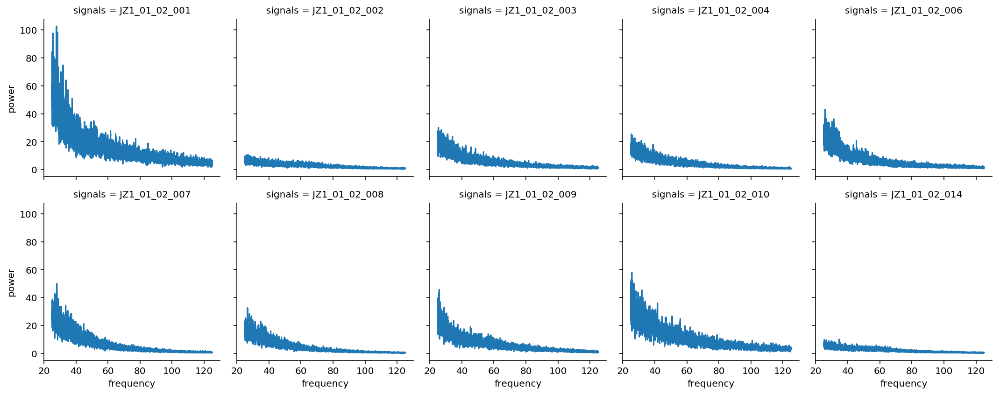

In [54]:
g = sns.FacetGrid(
    data=gamma_power.sel(frequency=slice(25, 125)).mean('time').to_dataframe().reset_index(),
    col='signals', col_wrap=5)
g.map(plt.plot, 'frequency', 'power')

## Neurons

Make sure we can get information about single units

In [27]:
neuron_info = lfdp.make_neuron_dataframe(ANIMALS).xs(epoch_key, drop_level=False)
neuron_info = pd.merge(
    neuron_info.reset_index('neuron_number'),
    tetrode_info.loc[:, ['area', 'subarea']], left_index=True, right_index=True
).set_index('neuron_number', append=True)
neuron_info

meanrate  numspikes  \
animal day epoch tetrode_number neuron_number                             
JZ1    1   2     2              1                 345.662322         42   
                 3              1                 172.831161         21   
                 10             1                7044.927323        856   
                                2                4049.187200        492   
                 12             1                  82.300553         10   
                 13             1               33175.352850       4031   
                 14             1                   8.230055          1   
                                2                   0.000000          0   
                                3                   0.000000          0   
                                4                 106.990719         13   
                 16             1                   8.230055          1   
                                2                1201.588071        146   
                                3                6682.804891        812   
                                4              474372.156516      57639   
                 17             1               21389.913683       2599   
                                2                6584.044227        800   
                 20             1                   8.230055          1   
                                2                 658.404423         80   
                                3                 197.521327         24   
                 24             1               19562.841410       2377   
                 26             1                   8.230055          1   
                 27             1               88440.174082      10746   
                                2              252498.096114      30680   
                 28             1               33907.827770       4120   
                                2               96011.824943      11666   
                                3               17875.680077       2172   
                                4               16056.837859       1951   
                                5               21719.115895       2639   
                                6               35060.035510       4260   
                                7               10756.682256       1307   
                                8               19291.249586       2344   
                                9                9423.413300       1145   

                                               spikewidth          neuron_id  \
animal day epoch tetrode_number neuron_number                                  
JZ1    1   2     2              1                     NaN  JZ1_01_02_002_001   
                 3              1                     NaN  JZ1_01_02_003_001   
                 10             1                     NaN  JZ1_01_02_010_001   
                                2                     NaN  JZ1_01_02_010_002   
                 12             1                     NaN  JZ1_01_02_012_001   
                 13             1                     NaN  JZ1_01_02_013_001   
                 14             1                     NaN  JZ1_01_02_014_001   
                                2                     NaN  JZ1_01_02_014_002   
                                3                     NaN  JZ1_01_02_014_003   
                                4                     NaN  JZ1_01_02_014_004   
                 16             1                     NaN  JZ1_01_02_016_001   
                                2                     NaN  JZ1_01_02_016_002   
                                3                     NaN  JZ1_01_02_016_003   
                                4                     NaN  JZ1_01_02_016_004   
                 17             1                     NaN  JZ1_01_02_017_001   
                                2                     NaN  JZ1_01_02_017_002   
                 20             1                     NaN  JZ

In [31]:
neuron_key = ('JZ1', 1, 2, 2, 1)
lfdp.get_spikes_dataframe(neuron_key, ANIMALS)

time
00:28:07.645200    1
00:28:07.791333    1
00:28:07.996533    1
00:28:08.173200    1
00:28:12.793300    1
00:28:33.395433    1
00:28:37.316900    1
00:28:37.333500    1
00:28:37.442433    1
00:28:37.458233    1
00:28:37.589867    1
00:28:37.611267    1
00:28:37.697633    1
00:28:37.857533    1
00:28:38.288800    1
00:28:38.401100    1
00:28:38.407767    1
00:28:38.573500    1
00:28:38.800433    1
00:28:38.829667    1
00:28:44.305767    1
00:28:50.698800    1
00:29:12.392567    1
00:29:28.834567    1
00:29:28.949267    1
00:29:30.397833    1
00:29:32.551500    1
00:29:32.836733    1
00:29:40.916500    1
00:29:41.091300    1
00:29:41.326567    1
00:29:41.370800    1
00:29:41.838567    1
00:31:09.833367    1
00:31:42.790400    1
00:31:42.802433    1
00:32:38.962933    1
00:37:32.344500    1
00:41:35.932800    1
00:43:46.986267    1
00:47:11.255267    1
00:47:30.985367    1
dtype: int64

In [37]:
neuron_key = ('JZ1', 1, 2, 2, 1)
lfdp.get_spike_indicator_dataframe(neuron_key, ANIMALS)

time
00:28:00.085200    0
00:28:00.085867    0
00:28:00.086533    0
00:28:00.087200    0
00:28:00.087867    0
00:28:00.088533    0
00:28:00.089200    0
00:28:00.089867    0
00:28:00.090533    0
00:28:00.091200    0
00:28:00.091867    0
00:28:00.092533    0
00:28:00.093200    0
00:28:00.093867    0
00:28:00.094533    0
00:28:00.095200    0
00:28:00.095867    0
00:28:00.096533    0
00:28:00.097200    0
00:28:00.097867    0
00:28:00.098533    0
00:28:00.099200    0
00:28:00.099867    0
00:28:00.100533    0
00:28:00.101200    0
00:28:00.101867    0
00:28:00.102533    0
00:28:00.103200    0
00:28:00.103867    0
00:28:00.104533    0
                  ..
00:48:15.124533    0
00:48:15.125200    0
00:48:15.125867    0
00:48:15.126533    0
00:48:15.127200    0
00:48:15.127867    0
00:48:15.128533    0
00:48:15.129200    0
00:48:15.129867    0
00:48:15.130533    0
00:48:15.131200    0
00:48:15.131867    0
00:48:15.132533    0
00:48:15.133200    0
00:48:15.133867    0
00:48:15.134533    0
00:48:15

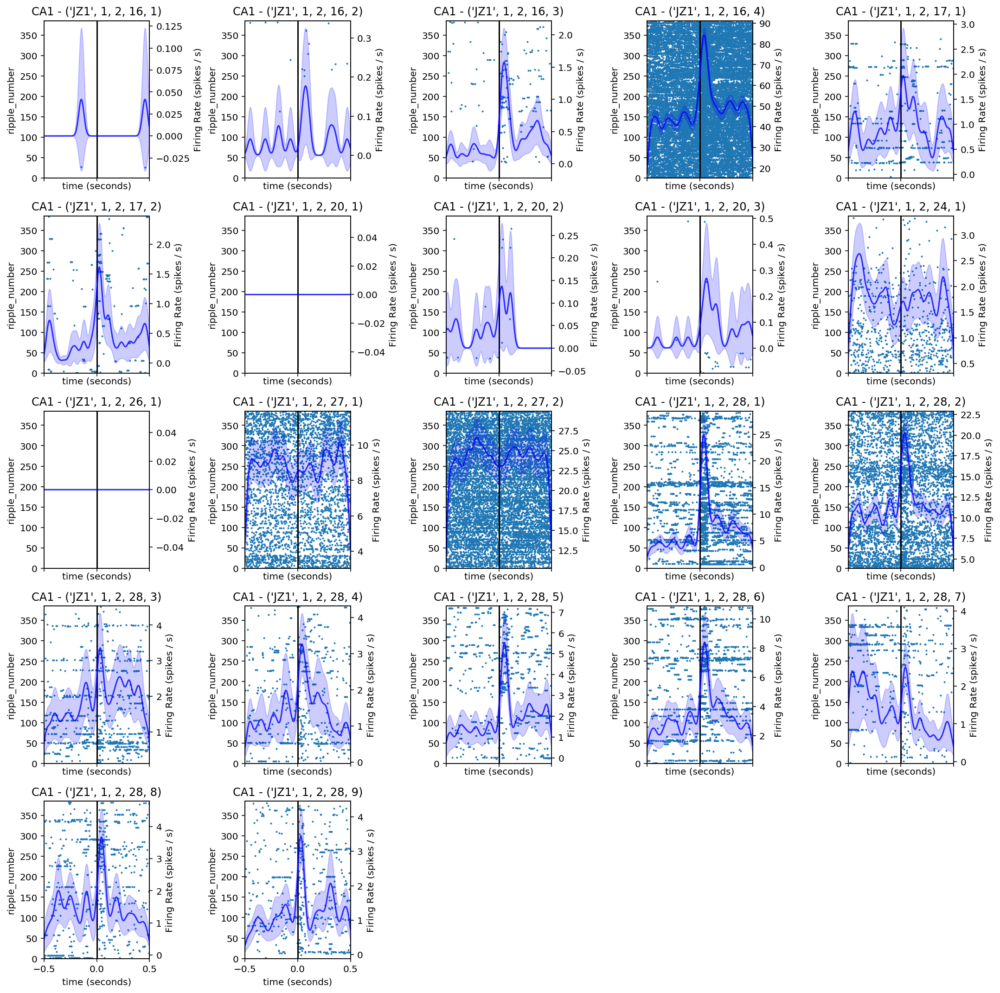

In [38]:
from src.visualization import plot_perievent_raster

ca1_neuron_keys = neuron_info.query('area == "ca1"').index
n_neurons = len(ca1_neuron_keys)

col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, neuron_key in zip(axes.ravel(), ca1_neuron_keys):
    plot_perievent_raster(neuron_key, ANIMALS, ripple_times,
                          tetrode_info, window_offset=(-0.5, 0.5),
                          ax=ax, s=1)
    
for ax in axes.ravel()[n_neurons:]:
    ax.axis('off')

plt.tight_layout()

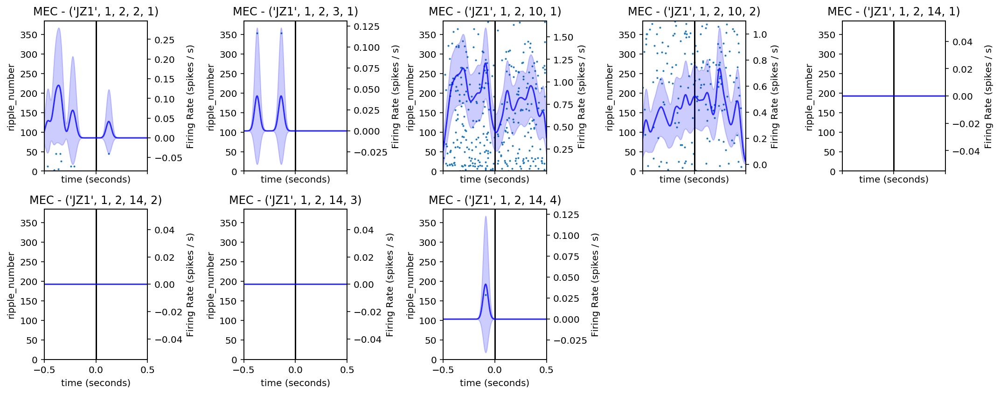

In [37]:
mec_neuron_keys = neuron_info.query('area == "mec"').index
n_neurons = len(mec_neuron_keys)

col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, neuron_key in zip(axes.ravel(), mec_neuron_keys):
    plot_perievent_raster(neuron_key, ANIMALS, ripple_times,
                          tetrode_info, window_offset=(-0.5, 0.5),
                          ax=ax, s=1)
    
for ax in axes.ravel()[n_neurons:]:
    ax.axis('off')

plt.tight_layout()

## Multiunit Data

In [36]:
tetrode_key = ('JZ1', 1, 2, 16)
lfdp.get_multiunit_indicator_dataframe(tetrode_key, ANIMALS)

,channel_1_max,channel_2_max,channel_3_max,channel_4_max
time,,,,
00:28:00.085200,NaN,NaN,NaN,NaN
00:28:00.085867,NaN,NaN,NaN,NaN
00:28:00.086533,NaN,NaN,NaN,NaN
00:28:00.087200,NaN,NaN,NaN,NaN
00:28:00.087867,NaN,NaN,NaN,NaN
00:28:00.088533,NaN,NaN,NaN,NaN
00:28:00.089200,NaN,NaN,NaN,NaN
00:28:00.089867,NaN,NaN,NaN,NaN
00:28:00.090533,NaN,NaN,NaN,NaN


In [67]:
lfdp.get_multiunit_indicator_dataframe(tetrode_key, ANIMALS).dropna()

,channel_1_max,channel_2_max,channel_3_max,channel_4_max
time,,,,
00:28:00.107200,-462.016846,-323.124939,-423.929871,-1239.720215
00:28:00.245200,-142.923462,-218.906876,-231.129303,-403.142303
00:28:00.247867,-495.303314,-564.385254,-698.149231,-1182.665405
00:28:00.255199,-68.474884,-2.318428,-177.536911,-68.409927
00:28:00.264533,-377.944366,-407.710175,-513.244934,-1116.178955
00:28:00.273200,-487.471222,-514.188904,-652.837402,-1302.791016
00:28:00.284533,-735.477478,-585.344177,-779.071472,-2144.586670
00:28:00.292533,22.151897,-96.771675,-74.239311,40.909298
00:28:00.293867,-495.303314,-564.385254,-698.149231,-1182.665405


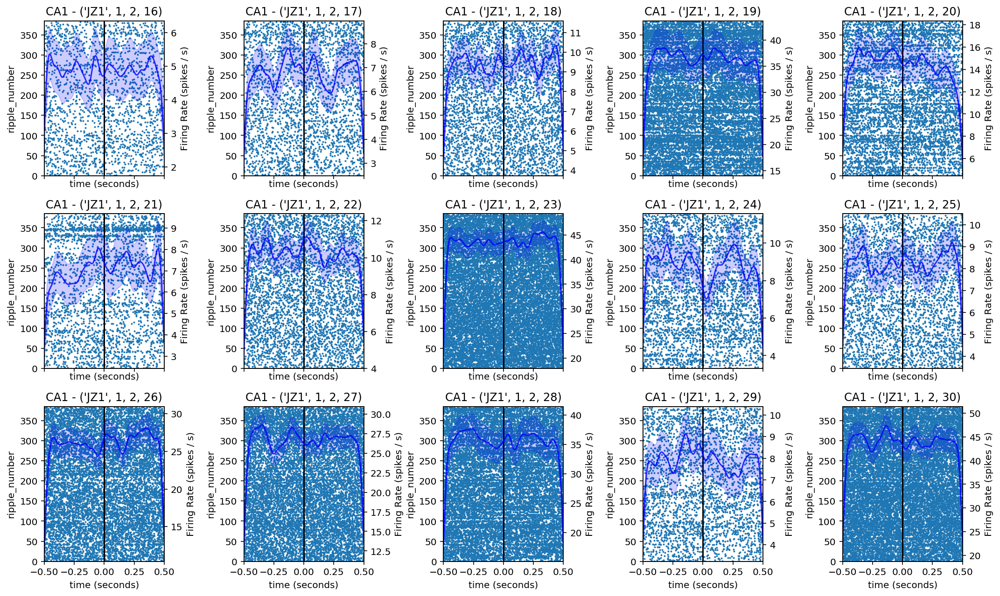

In [12]:
from src.visualization import plot_perievent_raster

ca1_keys = tetrode_info.query('area == "ca1"').index
n_tetrodes = len(ca1_keys)
col_wrap = 5
n_rows = np.ceil(n_tetrodes / col_wrap).astype(int)

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, tetrode_key in zip(axes.ravel(), ca1_keys):
    plot_perievent_raster(tetrode_key, ANIMALS, ripple_times,
                          tetrode_info, window_offset=(-0.5, 0.5),
                          ax=ax, s=1)
    
for ax in axes.ravel()[n_tetrodes:]:
    ax.axis('off')
plt.tight_layout()

## DIO

In [345]:
from loren_frank_data_processing.core import get_data_structure

def get_DIO(epoch_key, animals):
    ''''''
    animal, day, epoch = epoch_key
    pins = get_data_structure(animals[animal], day, 'DIO', 'DIO')[epoch - 1].squeeze()
    column_names = pins[0].dtype.names
    pins_df = []
    
    for pin in pins:
        time = pin['times'][0, 0].squeeze()
        if time.size > 1:
            time = pd.to_timedelta(time, unit='s')

            values = pin['values'][0, 0].squeeze()
            pin_id = pin['original_id'][0, 0].item()

            pins_df.append(
                pd.Series(values, index=[time], name=pin_id))
    return pd.concat(pins_df, axis=1)